# Analysing Ocean Voting Data


## Preparations 

In [296]:
!pip install networkx
!pip install seaborn
!pip install matplotlib
!pip install plotly
!pip install holoviews
!pip install panel

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.

In [297]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import networkx as nx 
from networkx.algorithms import bipartite

## Round 1 to 10 data

In [331]:
round_1_10_data = pd.read_csv("ocean-votes-round-1-to-10.csv")
round_1_10_data.head()


,address,balance,Vote,Round,Project Name,Proposal State,Proposal Standing,Grant Category,Earmarks,OCEAN Granted
0,0xebDcbE0f258B7F8Ebb7d3F5E57faE8C2204a5E64,8862.463109,Yes,1,APY.vision,Not Granted,Not Granted,Build & Integrate,General,0.0
1,0x5D2B315C465e133a346C960F46f5AA1ED88a3179,13840.708383,Yes,1,Data Whale,Funded,Completed,Build & Integrate,General,13000.0
2,0xB121b3DdaA9af45Df9878C855079F8A78eea9772,25934.100000,Yes,1,Data Whale,Funded,Completed,Build & Integrate,General,13000.0
3,0x1911176664F147DCb30DA4a4AA6ef6c6849e613f,4446.742291,Yes,1,Data Whale,Funded,Completed,Build & Integrate,General,13000.0
4,0x45E48C0a6Fe8b759652624451C83387130C58367,20801.288274,Yes,1,Data Whale,Funded,Completed,Build & Integrate,General,13000.0


In [328]:
hv.help(hv.Bars)


# df2 = df.groupby(['Round'])
# df
# bars = hv.Bars(df2, kdims=['Project Name', 'Proposal State'])
# bars.opts(width=1500)



Bars

Online example: http://holoviews.org/reference/elements/bokeh/Bars.html

-------------
Style Options
-------------

	alpha, bar_width, cmap, color, fill_alpha, fill_color, hover_alpha, hover_color, hover_fill_alpha, hover_fill_color, hover_line_alpha, hover_line_color, line_alpha, line_cap, line_color, line_dash, line_join, line_width, muted, muted_alpha, muted_color, muted_fill_alpha, muted_fill_color, muted_line_alpha, muted_line_color, nonselection_alpha, nonselection_color, nonselection_fill_alpha, nonselection_fill_color, nonselection_line_alpha, nonselection_line_color, selection_alpha, selection_color, selection_fill_alpha, selection_fill_color, selection_line_alpha, selection_line_color, visible

(Consult bokeh's documentation for more information.)

------------
Plot Options
------------

The plot options are the parameters of the plotting class:

Parameters of 'BarPlot'

Parameters changed from their default values are marked in red.
Soft bound values are marked in cyan

In [336]:
df = round_1_10_data
df = df.groupby(['Project Name', 'Round']).sum()
# df.head()
# df2 = df[df['balance'] > 5000000]
bars = hv.Bars(df, kdims=['Project Name', 'Round'])
bars.opts(stacked=True)
bars.opts(width=1500, height=800)
bars.redim.values() + bars.sort()
bars.clone().opts(multi_level=False)

:Bars   [Project Name,Round]   (balance,OCEAN Granted)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
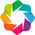

In [6]:
import holoviews as hv
import holoviews.plotting.mpl
from holoviews import opts, dim
import panel as pn
hv.extension("bokeh")

In [337]:
round_1_10_data.head()

,address,balance,Vote,Round,Project Name,Proposal State,Proposal Standing,Grant Category,Earmarks,OCEAN Granted
0,0xebDcbE0f258B7F8Ebb7d3F5E57faE8C2204a5E64,8862.463109,Yes,1,APY.vision,Not Granted,Not Granted,Build & Integrate,General,0.0
1,0x5D2B315C465e133a346C960F46f5AA1ED88a3179,13840.708383,Yes,1,Data Whale,Funded,Completed,Build & Integrate,General,13000.0
2,0xB121b3DdaA9af45Df9878C855079F8A78eea9772,25934.100000,Yes,1,Data Whale,Funded,Completed,Build & Integrate,General,13000.0
3,0x1911176664F147DCb30DA4a4AA6ef6c6849e613f,4446.742291,Yes,1,Data Whale,Funded,Completed,Build & Integrate,General,13000.0
4,0x45E48C0a6Fe8b759652624451C83387130C58367,20801.288274,Yes,1,Data Whale,Funded,Completed,Build & Integrate,General,13000.0


In [340]:
def makeSankeyList(dataframe, round):
    rounds = []
    df_round = dataframe
    if round > 0:
        df_round = dataframe[dataframe['Round'] == round]
        df_round.reset_index(drop=True, inplace=True)
    for row in df_round.itertuples():
        balance = row[2]
        round = [row[1], row[5], balance]
        rounds.append(round)
    return rounds


In [172]:
round_1_8_data = pd.read_csv("ocean-votes-round-1-to-8-with-timestamps.csv")
round_1_8_data.sort_values(by=['timestamp'], inplace=True)
round_1_8_data.reset_index(drop=True, inplace=True)
round_1_8_data.head()
df = round_1_8_data[(round_1_8_data['Project Name'] == 'Coral Market') & (round_1_8_data['Round'] == 4)]
df

,address,balance,timestamp,Vote,Round,Project Name,Proposal State,Proposal Standing,Grant Category,Earmarks,OCEAN Granted
318,0x65f4424CEa0593c53Fe4E34d55455238BD058a6c,2953.513180,1617472933,Yes,4,Coral Market,Funded,Completed,Build & Integrate,General,6500.0
341,0x12BD31628075C20919BA838b89F414241b8c4869,279790.691344,1617620532,Yes,4,Coral Market,Funded,Completed,Build & Integrate,General,6500.0


In [360]:
si = []
for i in range (1,11):
  sankey_list = makeSankeyList(round_1_10_data, i)
  sankey = hv.Sankey(sankey_list, ['From', 'To'])
  

  s = sankey.opts(opts.Sankey(cmap='Set1', title='Round ' + str(i), show_values=False, label_position='left', width=500, height=500,
                edge_color=dim('To').str(), node_color=dim('From').str()))
  si.append(s)

si[0] + si[1] + si[2] + si[3] + si[4] + si[5] + si[6] + si[7] + si[8] +si[9]

:Layout
   .Sankey.I    :Sankey   [From,To]   (Value)
   .Sankey.II   :Sankey   [From,To]   (Value)
   .Sankey.III  :Sankey   [From,To]   (Value)
   .Sankey.IV   :Sankey   [From,To]   (Value)
   .Sankey.V    :Sankey   [From,To]   (Value)
   .Sankey.VI   :Sankey   [From,To]   (Value)
   .Sankey.VII  :Sankey   [From,To]   (Value)
   .Sankey.VIII :Sankey   [From,To]   (Value)
   .Sankey.IX   :Sankey   [From,To]   (Value)
   .Sankey.X    :Sankey   [From,To]   (Value)

In [181]:
# from holoviews.operation.timeseries import rolling, rolling_outlier_std

# def get_project(df, project, round):
#     return df[(df['Project Name'] == project) & (df['Round'] == round)]


# def load_project(project, round, **kwargs):
#     df = get_project(round_1_8_data, project, round)
#     df['timestamp'] = df.timestamp.astype('datetime64[ns]')
#     return hv.Curve(df, ('timestamp', 'Time'), round).opts(framewise=True)

# round = range(1,9)
# projects = ['Coral Market', 'Data Whale', 'DataUnion Foundation']
# dmap = hv.DynamicMap(load_project, kdims=['Round','Project'])
# dmap = dmap.redim.values(Round=round, Project=projects)

# dmap.opts(framewise=True)
# rolling(dmap, rolling_window=2)





## Make networkx graphs to research relations

In [361]:
from typing import List
def makeGraphs_round_1_10(dataframe, round) -> List[nx.Graph]:
    # make networkx graphs per row
    Gs = []
    rounds = {}
    df_round = dataframe
    if round > 0:
        df_round = dataframe[dataframe['Round'] == round]
        df_round.reset_index(drop=True, inplace=True)
    for row in df_round.itertuples():
        G = nx.MultiDiGraph()
        round = row[3]
        if row[1] not in G.nodes():
            G.add_node(row[1], bipartite=0, round=round, balance=row[2])
            G.nodes[row[1]]['type'] = 'voter'
        if row[5] not in G.nodes():
            G.add_node(row[5], bipartite=1, round=round, state=row[6], standing=row[7], category=row[8], earmarks=row[9], granted=row[10])
            G.nodes[row[5]]['type'] = 'project'
        G.add_edge(row[1],row[5])
        U = nx.Graph()
        if row[0] > 0:
            U = Gs[row[0]-1].copy()
        U.update(G.edges(data=True),G.nodes(data=True))
        Gs.append(U)
    return Gs

In [362]:
G10 = makeGraphs_round_1_10(round_1_10_data, 10)
list(G10[1].edges())

[('0x423325991513d405cdD0bc2D0634722843D29728', 'Walkers Reserve Currency'),
 ('Walkers Reserve Currency', '0x729442D6001e5A4542C3edC851Ad1aa7aB5ACC49')]

In [363]:
# networkx.drawing.layout.bipartite_layout
G = G10[len(G10)-1]
kwargs = dict(width=800, height=1000, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))
top = nx.bipartite.sets(G)[0]
pos = nx.bipartite_layout(G, top)
graph = hv.Graph.from_networkx(G, nx.circular_layout).opts(opts.Graph(inspection_policy='nodes', tools=['hover', 'box_select'],
        edge_hover_line_color='red', edge_cmap='viridis', edge_color='granted', edge_line_width=hv.dim('granted')*0.00002))
hv.element.graphs.layout_nodes(graph, layout=nx.layout.bipartite_layout, kwargs={'nodes': top})


:Graph   [start,end]

## generate relations between rounds, voters and projects

In [392]:
round_1_10_data.head()
df5 = round_1_10_data[round_1_10_data['address'] == '0x006D0f31A00E1f9c017Ab039E9d0BA699433A28c']
df5

,address,balance,Vote,Round,Project Name,Proposal State,Proposal Standing,Grant Category,Earmarks,OCEAN Granted
1685,0x006D0f31A00E1f9c017Ab039E9d0BA699433A28c,66106.345450,Yes,9,Data Whale,Funded,Completed,Build & Integrate,NaN,22764.0
2052,0x006D0f31A00E1f9c017Ab039E9d0BA699433A28c,66101.011051,Yes,10,Data Whale,Down Voted,Completed,Build & Integrate,NaN,0.0


In [395]:
df4 = round_1_10_data.groupby(['Project Name', 'Round']).sum()
df4

balance  OCEAN Granted
Project Name                 Round                             
AI Synthetic Data Generation 5      7.418672e+04        60000.0
APY.vision                   1      8.862463e+03            0.0
Alcor Network                9      1.377415e+06       386988.0
                             10     5.091295e+06            0.0
Algovera                     6      6.419480e+05       435200.0
...                                          ...            ...
WorkPi                       10     1.122081e+07            0.0
deltaDAO                     4      2.134825e+05       104000.0
                             5      9.620308e+05       210000.0
nCight                       10     2.905340e+06            0.0
roto.life                    5      3.891659e+04        52500.0

[172 rows x 2 columns]

In [368]:
from typing import List
def makeRoundList_round_1_10(dataframe, round) -> List[nx.Graph]:

    rounds = {}
    df_round = dataframe
    if round > 0:
        df_round = dataframe[dataframe['Round'] == round]
        df_round.reset_index(drop=True, inplace=True)
    for row in df_round.itertuples():
        round = row[4]
        granted = row[10]
        balance = row[2]
        if row[1] not in rounds:
            rounds[row[1]] = [(round, balance)]
        if (round, balance) not in rounds[row[1]]:
            rounds[row[1]].append((round, balance))
        if row[5] not in rounds:
            rounds[row[5]] = [(round, granted)]
        if (round,granted) not in rounds[row[5]]:
            rounds[row[5]].append((round, granted))
    return rounds

In [382]:
rounds = makeRoundList_round_1_10(round_1_10_data, 0)
participation = {}
for key, value in rounds.items():
  if key in participation:
    participation[key] = participation[key] + 1
  else:
    participation[key] = 1
participation['Data Whale']


1

In [396]:
def participating_round(roundz, type, rnum) :
    """
    Get the rounds participated in
    """
    Gr = nx.Graph()
    
    if type == 'project':
        for entity, roundlist in roundz.items():
            if '0x' not in entity and 'Round' not in entity and len(roundlist) > rnum:
                Gr.add_node(entity, type="project")
                for round in roundlist:
                    rn = "Round " + str(round[0])
                    Gr.add_node(rn, type="round")
                    Gr.add_edge(entity, rn, granted=round[1])
    
    if type == 'voter':
        for entity, roundlist in roundz.items():
            if '0x' in entity and len(roundlist) > rnum:
                Gr.add_node(entity, type="voter")
                for round in roundlist:
                    rn = "Round " + str(round[0])
                    Gr.add_node(rn, type="round")
                    Gr.add_edge(entity, rn, balance=round[1])

    return Gr
    # Return it 

## who participates in what round?

In [406]:
hv.help(hv.Graph)

Graph

Online example: http://holoviews.org/reference/elements/bokeh/Graph.html

-------------
Style Options
-------------

	cmap, edge_alpha, edge_cmap, edge_color, edge_fill_alpha, edge_fill_color, edge_hover_alpha, edge_hover_color, edge_hover_fill_alpha, edge_hover_fill_color, edge_hover_line_alpha, edge_hover_line_color, edge_line_alpha, edge_line_cap, edge_line_color, edge_line_dash, edge_line_join, edge_line_width, edge_muted, edge_muted_alpha, edge_muted_color, edge_muted_fill_alpha, edge_muted_fill_color, edge_muted_line_alpha, edge_muted_line_color, edge_nonselection_alpha, edge_nonselection_color, edge_nonselection_fill_alpha, edge_nonselection_fill_color, edge_nonselection_line_alpha, edge_nonselection_line_color, edge_selection_alpha, edge_selection_color, edge_selection_fill_alpha, edge_selection_fill_color, edge_selection_line_alpha, edge_selection_line_color, edge_visible, node_alpha, node_cmap, node_color, node_fill_alpha, node_fill_color, node_hover_alpha, node_hover_

In [411]:
Gr = participating_round(rounds, 'project', 3)


kwargs = dict(width=800, height=500, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))
top = nx.bipartite.sets(Gr)[0]
pos = nx.bipartite_layout(Gr, top)
graph = hv.Graph.from_networkx(Gr, nx.circular_layout).opts(opts.Graph(inspection_policy='nodes', tools=['hover'], title='Project participation > 3 Rounds',
        edge_cmap='viridis'))
hv.element.graphs.layout_nodes(graph, layout=nx.layout.bipartite_layout, kwargs={'nodes': top})

:Graph   [start,end]   (granted)

## Build up graphs according to # rounds participating

In [412]:
GraphRoundsVoter = []
for i in range(1,11):
  GraphRoundsVoter.append(participating_round(rounds, 'voter', i))

GraphRoundsProject= []
for i in range(1,11):
  GraphRoundsProject.append(participating_round(rounds, 'project', i))


## Voters participating in rounds

In [413]:
kwargs = dict(width=800, height=800, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))

colors = ['#000000']+hv.Cycle('Category20').values

hv.HoloMap({i: hv.Graph.from_networkx(GraphRoundsVoter[i], nx.spring_layout, iterations=i, seed=10) for i in range(1, len(GraphRoundsVoter), 1)},
           kdims='Voter participating in # rounds > ').opts(opts.Graph(inspection_policy='nodes', tools=['hover'],
               node_color='type', edge_hover_line_color='red', edge_cmap=colors, edge_color='balance', edge_line_width=hv.dim('balance')*0.00002))

:HoloMap   [Voter participating in # rounds > ]
   :Graph   [start,end]

## Projects participating in rounds

In [416]:
hv.HoloMap({i: hv.Graph.from_networkx(GraphRoundsProject[i], nx.spring_layout, iterations=i, seed=10) for i in range(1, len(GraphRoundsProject), 1)},
           kdims='Project participating in # rounds > ').opts(opts.Graph(inspection_policy='nodes', tools=['hover'],
               node_color='type', edge_hover_line_color='red', edge_cmap=colors))

:HoloMap   [Project participating in # rounds > ]
   :Graph   [start,end]

## Making networkx Graphs with timestamps

### Round 1 to 8 data with timestamps

In [135]:
round_1_8_data = pd.read_csv("ocean-votes-round-1-to-8-with-timestamps.csv")
round_1_8_data.sort_values(by=['timestamp'], inplace=True)
round_1_8_data.reset_index(drop=True, inplace=True)
round_1_8_data.head()

,address,balance,timestamp,Vote,Round,Project Name,Proposal State,Proposal Standing,Grant Category,Earmarks,OCEAN Granted
0,0x9e95B6c35a43A61B06F19d21FBe008f17B1f5e44,300.011809,1608035489,Yes,1,Wisdom Of the Web,Not Granted,Not Granted,Build & Integrate,General,0.0
1,0x01e66950353400E93AEe7F041C0303103E2ef5Ab,5271.992999,1608035989,Yes,1,Operation Plankton,Not Granted,Not Granted,Outreach,General,0.0
2,0x362CfE20851584DF00a670b2c8460A3aafD35839,3268.114915,1608036130,Yes,1,Operation Plankton,Not Granted,Not Granted,Outreach,General,0.0
3,0x1Daf0b27e0F54a235abb5D52D276033394Eb8F49,567.687949,1608037321,Yes,1,Ocean Academy,Funded,Unreported,Outreach,General,13000.0
4,0xcC7E9b8331bea863a158589E8EBCF118C72d0683,7084.813123,1608037427,Yes,1,Ocean Academy,Funded,Unreported,Outreach,General,13000.0


In [182]:
from typing import List
def makeGraphs_round_1_8(dataframe, round) -> List[nx.Graph]:
    # make networkx graphs per row
    Gs = []
    df_round = dataframe
    if round > 0:
        df_round = dataframe[dataframe['Round'] == round]
        df_round.reset_index(drop=True, inplace=True)
    else:
        return [nx.Graph()]
    for row in df_round.itertuples():
        G = nx.Graph()
        G.add_node(row[1], round=row[5])
        G.nodes[row[1]]['type'] = 'voter'
        G.nodes[row[1]]['balance'] = row[2]
        G.add_node(row[6], round=row[5], state=row[7], standing=row[8], category=row[9], earmarks=row[10], granted=row[11])
        G.nodes[row[6]]['type'] = 'project'
        G.add_edge(row[1],row[6], timestamp=row[3])
        U = nx.Graph()
        if row[0] > 0:
            U = Gs[row[0]-1].copy()
        U.update(G.edges(data=True),G.nodes(data=True))
        Gs.append(U)
    return Gs
  

In [183]:
Graphs = []
for i in range(1,9):
  Graphs.append(makeGraphs_round_1_8(round_1_8_data, i))


In [184]:
def total_balance(G: nx.Graph, node: str) :
    """
    Get the total votes for a given project
    """
    node_edges = []
    # Get all the graph edges associated with the node
    try:
        node_edges = list(G.neighbors(node))
    except:
        pass
    
    # Sum all votes contained in the edges that contains the node
    total_amount = sum(G.nodes.get(edge)['balance']
                       for edge
                       in node_edges)
    
    # Return it
    return total_amount

In [187]:
total_balance(Graphs[2][40],'Data Whale')

305862.6957067567

In [189]:
def add_totals(G: nx.Graph) -> nx.Graph:
    """
    Add total_amount from contributions and the degree of each node
    """
    contrib_row = list(G.edges().data())
    # Make sure that we have data
    if len(contrib_row) > 0:
        
        # Get unique projects and voters
        l = list(G.nodes().data())
        unique_projects = set([t[0] for t in l if t[1]['type'] == 'project'])
        unique_voters = set([t[0] for t in l if t[1]['type'] == 'voter'])

        project_node_type = {el: {'type': 'project',
                                   'total_vote_balance': total_balance(G, el),
                                  'degree': G.degree[el]} 
                             for el in unique_projects}
        # voter_node_type = {el: {'type': 'voter',
        #                            'total_vote_balance': total_balance(G, el),
        #                           'degree': G.degree[el]} 
        #                      for el in unique_voters}

        node_type = {**project_node_type}    
        
        nx.set_node_attributes(G, node_type)
        
        # Return the graph
        return G
    else:
        return None

In [193]:
graphs = []
for g in Graphs[7]:
    graphs.append(add_totals(g))

graphs[1].nodes

NodeView(('0x48b576c87e788a762D6f95A456f2A39113b46950', 'RugPullIndex', 'OceanTel'))

In [194]:
kwargs = dict(width=800, height=800, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))

hv.HoloMap({i: hv.Graph.from_networkx(graphs[i], nx.spring_layout, iterations=i, seed=10) for i in range(1, len(graphs), 5)},
           kdims='Timestep').opts(opts.Graph(inspection_policy='nodes', tools=['hover'],
               node_color='type', edge_hover_line_color='red', edge_cmap=colors, edge_color='total_vote_balance', edge_line_width=hv.dim('total_vote_balance')*0.002))

:HoloMap   [Timestep]
   :Graph   [start,end]   (timestamp)

In [195]:
round_11_votes = pd.read_csv("votes.csv")
round_11_choices = pd.read_csv("choices.csv")
round_11_votes.head()

,voter,created,choice/1,choice/39,choice/37,choice/3,choice/7,choice/11,choice/19,choice/27,...,choice/30,choice/32,choice/14,choice/18,choice/20,choice/28,choice/36,choice/4,choice/16,choice/38
0,0xCe7BE31f48205C48A91A84E777a66252Bba87F0b,1636415781,6.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0x5066Fbe092caee0d19Ddd0B3302eA4e925726F80,1636415753,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0xe16aeE13e6a7bA2d2f5Bf338F8b063C33Ff8ff87,1636414806,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0xb821A211957E317aF957b28e7292b27a8f9A3b73,1636414684,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0x2da922CBeB06c377741a51dDc85c735429Bc2965,1636413869,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [196]:
# replace choices with projectnames_Yes/No
def convert(x, dic):
  for k in dic:
    if str(k) == str(x):
      return dic[k]
  return x

In [197]:
d = round_11_choices.to_dict(orient='records')
d[0].pop('choice/0')
e = d[0]
round_11_votes.rename(columns=lambda x: convert(x,e), inplace=True)
round_11_votes.sort_values(by=['created'], inplace=True)
round_11_votes.reset_index(drop=True, inplace=True)
round_11_votes


,voter,created,HealthLink_Yes,Algovera_Yes,Nigeria Community Building_Yes,Ocean Protocol Japan_Yes,Data Whale_Yes,TokenSPICE_Yes,Ocean Pearl_Yes,Evotegra_Yes,...,Taurus Chain Network_No,nCight_No,DATAPOGY_No,Datalatte.ai_No,Ocean Pearl_No,Evotegra_No,Ocean Missions_No,Ocean Protocol Japan_No,Ocean Protocol Turkey Community_No,Nigeria Community Building_No
0,0x0cEC1Dbc5Db276dE35808bf717a4491082fDb8d8,1636078730,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0xbbd33AFa85539fa65cc08A2e61a001876D2f13FE,1636083432,NaN,NaN,NaN,1.0,2.0,2.0,2.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0x655eFe6Eb2021b8CEfE22794d90293aeC37bb325,1636091509,2.0,2.0,NaN,1.0,1.0,2.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0x30A50782c586e21B7cd54727E0927ed89d1d977D,1636097256,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0x54cbDab6a0D6694d6cf810c1e9eb5f9482412E1D,1636099220,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,0x2da922CBeB06c377741a51dDc85c735429Bc2965,1636413869,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
102,0xb821A211957E317aF957b28e7292b27a8f9A3b73,1636414684,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
103,0xe16aeE13e6a7bA2d2f5Bf338F8b063C33Ff8ff87,1636414806,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104,0x5066Fbe092caee0d19Ddd0B3302eA4e925726F80,1636415753,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [259]:
df = round_11_votes['Algovera_Yes'].sum()
df


1355.0

In [213]:
# make networkx graphs per row
Gs = []
for row in round_11_votes.itertuples():
    G = nx.Graph()
    G.add_node(row[1])
    G.nodes[row[1]]['type'] = 'voter'
    for i in range(3,40):
        # check if vote is not NaN
        if row[i] > 0:
            G.add_node(round_11_votes.columns[i-1], votes=row[i])
            G.nodes[round_11_votes.columns[i-1]]['type'] = 'project'
            G.add_edge(row[1],round_11_votes.columns[i-1])
    U = nx.Graph()
    if row[0] > 0:
        U = Gs[row[0]-1].copy()
    U.update(G.edges(data=True),G.nodes(data=True))
    Gs.append(U)

In [216]:
list(Gs[0].neighbors('0x0cEC1Dbc5Db276dE35808bf717a4491082fDb8d8'))
Gs[0].nodes.get('Algovera_Yes')['votes']

1.0

In [217]:
def total_votes(G: nx.Graph, node: str) :
    """
    Get the total votes for a given project
    """
    node_edges = []
    # Get all the graph edges associated with the node
    try:
        node_edges = list(G.neighbors(node))
    except:
        pass
    
    # Sum all votes contained in the edges that contains the node
    total_amount = sum(G.nodes.get(edge)['votes']
                       for edge
                       in node_edges)
    
    # Return it
    return total_amount

In [260]:
def add_totals(G: nx.Graph) -> nx.Graph:
    """
    Add total_amount from contributions and the degree of each node
    """
    contrib_row = list(G.edges().data())
    # Make sure that we have data
    if len(contrib_row) > 0:
        
        # Get unique projects and voters
        l = list(G.nodes().data())
        unique_voters = set([t[0] for t in l if t[1]['type'] == 'voter'])
        unique_projects = set([t[0] for t in l if t[1]['type'] == 'project'])

        project_node_type = {el: {'type': 'project',
                                   'total_votes': round_11_votes[el].sum(),
                                  'degree': 1} 
                             for el in unique_projects}
        voter_node_type = {el: {'type': 'voter',
                                   'total_votes': total_votes(G, el),
                                  'degree': G.degree[el]} 
                             for el in unique_voters}

        node_type = {**voter_node_type, **project_node_type}    
        
        nx.set_node_attributes(G, node_type)
        
        # Return the graph
        return G
    else:
        return None

In [261]:
graphs = []
for g in Gs:
    graphs.append(add_totals(g))

In [221]:
from bokeh.models import HoverTool

In [262]:
import math
import random

number_of_colors = 20
l = list(Gs[len(Gs)-1].nodes().data())
unique_projects = set([t[0] for t in l if t[1]['type'] == 'project'])
unique_voters = set([t[0] for t in l if t[1]['type'] == 'voter'])
color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]
projects_2_color = {}
voters_2_color = {}
for grant in unique_projects:
    projects_2_color[grant] = color[random.randint(0, 19)]
for contributor in unique_voters:
    voters_2_color[contributor] = color[random.randint(0, 19)]

In [283]:
def make_points(G: nx.graph, node_type: str):
    ps = []
    hover = []
    n2c = {}
    if node_type == 'project':
        n2c = projects_2_color
    else:
        n2c = voters_2_color
    nds = list(G.nodes().data())
    nodes = [n for n in nds if n[1]['type'] == node_type]
    for node in nodes:
        total_votes = node[1]['total_votes']
        # print("Node: ", node)
        degree = node[1]['degree']
        if degree == 0: degree = 1 # ugly hack preventing division by 0!
        ratio = total_votes/degree
        if node_type == node[1]['type'] and ratio < 1000:
            hover.append((node[0], str(total_votes)))
            ps.append([ degree, ratio, n2c[node[0]], total_votes*0.001 ])
    hover = HoverTool(description='Custom Tooltip', tooltips = hover)    
    popts = opts.Points(color='z', size=dim('size'),  frame_width=800, frame_height=800, tools=[hover])
    points = hv.Points(ps, vdims=['z', 'size'])
    points.opts(popts)  
    return points

In [284]:
def hvplot_points_sequence(Gs: list, node_type='voter', step=1):
    # TODO add test
    hmap = hv.HoloMap({i:make_points(Gs[i], node_type) for i in list(range(1,len(Gs), step))}, kdims='timestep')
    return hmap

In [295]:
hmap = hvplot_points_sequence(graphs, 'voter')
hmap

:HoloMap   [timestep]
   :Points   [x,y]   (z,size)

## Rounds 5 Through 10 

In [245]:
final_data = pd.read_csv("ocean-votes-round-1-to-10.csv")
final_data.tail()

,address,balance,Vote,Round,Project Name,Proposal State,Proposal Standing,Grant Category,Earmarks,OCEAN Granted
2982,0x27B3035ab7F71d711dE25f114768F5F64B61857B,44349.800000,Yes,10,DataX,Funded,Unreported,Build & Integrate,NaN,17242.0
2983,0x6131C5bBe0FA34Dc0F96E931BcA3E611A5199EEF,66169.236442,Yes,10,DataX,Funded,Unreported,Build & Integrate,NaN,17242.0
2984,0x42a19cd756651A488f1899157c45Af929bf3695F,32000.000000,Yes,10,DataX,Funded,Unreported,Build & Integrate,NaN,17242.0
2985,0xbbd33AFa85539fa65cc08A2e61a001876D2f13FE,30859.690569,Yes,10,DataX,Funded,Unreported,Build & Integrate,NaN,17242.0
2986,0x7f8c1877Ed0DA352F78be4Fe4CdA58BB804a30dF,493.932066,Yes,10,DataX,Funded,Unreported,Build & Integrate,NaN,17242.0


## Homework session 26-11-2021

Q1. Which round had the largest number of projects?

Q2. Which round had the largest number of votes?

Q3. What was the average amount of OCEAN received per project in Round 9?

Q4. In Round 8, what percentage of Projects proposed received some funding?

Q5. Over all rounds, what is the average amount of OCEAN received per project?


In [ ]:
final_data.head(10)

,address,balance,Vote,Round,Project Name,Proposal State,Grant Category,Earmarks,OCEAN Granted
0,0x9e95B6c35a43A61B06F19d21FBe008f17B1f5e44,300.011809,Yes,1,Wisdom Of the Web,Not Granted,Build & Integrate,General,0.0
1,0x01e66950353400E93AEe7F041C0303103E2ef5Ab,5271.992999,Yes,1,Operation Plankton,Not Granted,Outreach,General,0.0
2,0x362CfE20851584DF00a670b2c8460A3aafD35839,3268.114915,Yes,1,Operation Plankton,Not Granted,Outreach,General,0.0
3,0x1Daf0b27e0F54a235abb5D52D276033394Eb8F49,567.687949,Yes,1,Ocean Academy,Funded,Outreach,General,13000.0
4,0xcC7E9b8331bea863a158589E8EBCF118C72d0683,7084.813123,Yes,1,Ocean Academy,Funded,Outreach,General,13000.0
5,0xf3a7ACf685c737B632Ffe4265BB9094C25cF8Ac4,536.381785,Yes,1,Ocean Academy,Funded,Outreach,General,13000.0
6,0xbbd33AFa85539fa65cc08A2e61a001876D2f13FE,3960.241304,Yes,1,Data Whale,Funded,Build & Integrate,General,13000.0
7,0x3DA6cb84752975352711ACAb5613B4E23e04fbfc,24510.213920,Yes,1,Operation Plankton,Not Granted,Outreach,General,0.0
8,0xcBdD51CF4e679542de0AC059Ae7399d798870F5F,29999.978084,Yes,1,Ocean Academy,Funded,Outreach,General,13000.0
9,0xAFBA2f63810e1Be2F56e95b77fD20f62a3Aef46a,2124.793356,Yes,1,Data Whale,Funded,Build & Integrate,General,13000.0


### Q1. Which round had the largest number of projects?

In [ ]:
max_projects = 0
for i in range(1,11):
  df = final_data[final_data['Round'] == i]
  nr_projects = df['Project Name'].nunique()
  if nr_projects > max_projects:
    max_projects = nr_projects
    round = i
  print("Round", i, ", Number of Projects: " , nr_projects)
print("Round ", round, "has largest number of projects: ", max_projects)

Round 1 , Number of Projects:  9
Round 2 , Number of Projects:  14
Round 3 , Number of Projects:  18
Round 4 , Number of Projects:  14
Round 5 , Number of Projects:  15
Round 6 , Number of Projects:  14
Round 7 , Number of Projects:  22
Round 8 , Number of Projects:  18
Round 9 , Number of Projects:  17
Round 10 , Number of Projects:  31
Round  10 has largest number of projects:  31


### Q2. Which round had the largest number of votes?


## Voting data

In [ ]:
for i in range(4,11):
  sheet = "Round " + str(i) + " Results"
  rd_i_vote_data = pd.read_excel("OceanDAOVotes.xlsx", sheet_name = sheet)
  max_votes = rd_i_vote_data['Num Voters'].max()
  max_index = rd_i_vote_data['Num Voters'].idxmax()
  t = rd_i_vote_data.loc[max_index]['Project Name']
  print("Round " + str(i), "max votes: ", t, max_votes)

Round 4 max votes:  Green Light 26
Round 5 max votes:  deltaDAO 28
Round 6 max votes:  Ocean Ambassadors Grant Proposal - Project FlagShip 45
Round 7 max votes:  oceanSPICE Simulations 31
Round 8 max votes:  Odd.Bot 42
Round 9 max votes:  DataUnion Foundation 29
Round 10 max votes:  Data Whale 83


In [ ]:
for i in range(4,11):
  sheet = "Round " + str(i) + " Results"
  rd_i_vote_data = pd.read_excel("OceanDAOVotes.xlsx", sheet_name = sheet)
  max_votes = rd_i_vote_data['Num Voters'].sum()
  print("Round " + str(i), "max votes total: ", max_votes)

Round 4 max votes total:  101
Round 5 max votes total:  271
Round 6 max votes total:  259
Round 7 max votes total:  345
Round 8 max votes total:  371
Round 9 max votes total:  234
Round 10 max votes total:  1180


### Q3. What was the average amount of OCEAN received per project in Round 9?


In [ ]:
df_round9 = final_data[final_data['Round'] == 9]
average = df_round9['OCEAN Granted'].mean()
print("OCEAN received on average: ", average)

OCEAN received on average:  20705.803418803418


### Q4. In Round 8, what percentage of Projects proposed received some funding?


In [ ]:
df_round8 = final_data[final_data['Round'] == 8]
projects = len(df_round8.index)
some_funding = df_round8['OCEAN Granted'] > 0
df_round8[some_funding]
funded_projects = len(df_round8[some_funding].index)
print("Funded projects Round 8: ", 100 * funded_projects/projects , "%")


Funded projects Round 8:  56.639566395663955 %


### Q5. Over all rounds, what is the average amount of OCEAN received per project?


In [ ]:
average = final_data['OCEAN Granted'].mean()
print('Over all rounds, average amount of OCEAN received per project: ', average)

Over all rounds, average amount of OCEAN received per project:  12528.649815868765


## Transparency: A Disappearing Proposal in Round 5

There are two proposals entitled "Data Union App" in the "Round 5 Results" sheet of the "OceanDAOVotes.xlsx" spreadsheet, but only one corresponding project (labeled "Data Union Foundation") in the "All Proposals" data pulled from the AirTable. The ipfsHash for one of them does not appear in the AirTable data. I have decided to call this "Disappeared Data Union Proposal" for now, it could possibly be dropped once we understand what happened. 

In [ ]:
all_proposals = pd.read_csv("All Proposals.csv")

In [ ]:
rd_5_proposal_data = all_proposals[all_proposals["Round"] == 5]

In [ ]:
rd_5_proposal_names = rd_5_proposal_data["Project Name"]

In [ ]:
rd_5_vote_data = pd.read_excel("OceanDAOVotes.xlsx", sheet_name = "Round 5 Results")
rd_5_vote_data

,ipfsHash,Project Name,Yes,No,Num Voters,Sum Votes,Unnamed: 6,Unnamed: 7,Unnamed: 8,Num Proposals,Unique Wallets,Num Votes,Num yes,Num No,Sum Yes,Sum No,Sum Votes.1
0,QmSqZmovPa597i2LdFB8eEVqu8LRK9XuQBf49MhhAFdiBQ,Project Coral,6.667159e+05,500.000000,20,6.672159e+05,NaN,NaN,NaN,17.0,69.0,271.0,256.0,15.0,1.157383e+07,56835.300345,1.163066e+07
1,QmTQnbVS9i6fa9b1cV93KEJ9riUTdmyDXPmopC9yrUheZG,DeFi Pulse for Datatokens,4.339827e+04,0.000000,5,4.339827e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,QmVyPo566SRodxKNSrznrCsMvHrbLn88QwDxpGyM33iH67,AI Synthetic Data Generation,7.368672e+04,500.000000,8,7.418672e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,QmVUMeUFdX2TvzJEgF2Uf9Gq5N6vWHvV8boziYXwTdv6LZ,Data Union App,1.008762e+06,500.000000,27,1.009262e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,QmcNpiuPrvk6QWDx344FU7qjZYasM93aBJ6H2QnsafydMm,Data Union App,1.014809e+06,500.000000,26,1.015309e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,QmR8zuyKNUk1MJtQBeTmCVEkuhBLPt2pgNxj8QgW5xJQ5r,deltaDAO,9.620308e+05,0.000000,28,9.620308e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,QmcibtsLHWuGVWugsaooKRDV8Zx5M1auAFRv1f8YsrSb8L,VideoWiki,5.202305e+04,29997.870217,10,8.202092e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,QmQvFzquuCRbNesQtuHKJ5Z5JqgCN8WbE8BHjXyquukgm6,RugPullIndex,1.235214e+06,500.000000,15,1.235714e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,QmRD6RX87LyLDcJkCh4eqUau95394DRL1eQY9znRPByJrB,Go to Market Analysis,9.224168e+05,1470.000000,17,9.238868e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,QmVe6Bk1dq4r9uAgRyANdFrYhF8d2S7UajqACb3USMBehU,ResilientML,9.822324e+05,500.000000,12,9.827324e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
rd_4_vote_data = pd.read_excel("OceanDAOVotes.xlsx", sheet_name = "Round 4 Results")
rd_4_vote_data

,ipfsHash,Project Name,Yes,No,Num Voters,Sum Votes,Unnamed: 6,Unnamed: 7,Unnamed: 8,Num Proposals,Unique Wallets,Num Votes,Num yes,Num No,Sum Yes,Sum No,Sum Votes.1
0,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,SecondLook,587.000000,0,1,587.000000,NaN,NaN,NaN,14.0,101.0,101.0,101.0,0.0,2.306148e+06,0.0,2.306148e+06
1,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,The Currents Project,600.000000,0,1,600.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,Swipe AI,743070.330191,0,6,743070.330191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,Data Union App,188499.697821,0,9,188499.697821,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,Green Light,464037.165307,0,26,464037.165307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,Oort Digital Platform,283404.115453,0,19,283404.115453,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,Open Science Bay,32102.641334,0,2,32102.641334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,deltaDAO,188721.762590,0,16,188721.762590,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,Ocean Dashboard,150260.815378,0,2,150260.815378,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,QmYdPQ59SBTV5MbyQZ2AGrEWYBe2jaqDhydM9xWhz6LAsX,RugPullIndex,86964.451613,0,5,86964.451613,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
rd_5_vote_names = rd_5_vote_data["Project Name"]

In [ ]:
rd_5_proposal_names

59                   Project Coral
60       DeFi Pulse for Datatokens
61    AI Synthetic Data Generation
62            DataUnion Foundation
63                        deltaDAO
64                    Posthuman AI
65                       VideoWiki
66                    RugPullIndex
67                  Ocean Missions
68                    Resilient ML
69                    Resilient ML
70                      roto.life 
71                        Evotegra
72                     Ocean Pearl
73                   Ocean Vantage
74                    Posthuman AI
75          Go to Market Analysis 
76                     The Pelican
Name: Project Name, dtype: object

In [ ]:
len(rd_5_proposal_names)

18

In [ ]:
rd_5_vote_names

0                    Project Coral
1        DeFi Pulse for Datatokens
2     AI Synthetic Data Generation
3                   Data Union App
4                   Data Union App
5                         deltaDAO
6                        VideoWiki
7                     RugPullIndex
8           Go to Market Analysis 
9                      ResilientML
10                     ResilientML
11                      roto.life 
12                        Evotegra
13                     Ocean Pearl
14                  Vantage Crypto
15                    Posthuman AI
16                     The Pelican
Name: Project Name, dtype: object

In [ ]:
len(rd_5_vote_names)

17

## Summary and Questions

1. We've gotten the data into a format that will support early analysis. Many other formats are possible, and we'd be happy to re-run with a different focus if desired.  

2. Rounds 1 through 4 are different than 5 through 10, and it might be worth re-processing the data to get two different data sets with different information. Our current data set focuses on the information in common between the two rounds. 

2. We're not sure how to pull data from snapshot automatically at this point, and that would help a lot. Does snapshot have an API?